# IGRINS Data Analysis Template

This notebook should be able to handle any IGRINS txt spectrum. Each notebook will:

- Mark each photospheric feature
- Fit a local continuum
- Fit a (multi-component) Gaussian
- Calculate Equivalent Widths for each feature

In [5]:
# from muler.igrins import IGRINSSpectrum
# from muler.hpf import HPFSpectrum

import numpy as np
import matplotlib.pyplot as plt
# import matplotlib.patches as patches
import pandas as pd


import glob
import os
# import warnings

import astropy.units as u
# from astropy.io import ascii
# from astropy.io import fits
# from astropy.table import Table, Column, join
# from astropy.wcs import WCS
from astropy.modeling import models, fitting

from specutils import Spectrum1D
from specutils import SpectralRegion
from specutils.fitting import fit_generic_continuum, fit_continuum, fit_lines, find_lines_threshold
from specutils.analysis import equivalent_width
from specutils.manipulation import noise_region_uncertainty

from scipy.integrate import trapz
from scipy.optimize import curve_fit

%matplotlib inline
%config InlineBackend.figure_format='retina'
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

In [2]:
# Plotting Parameters
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] =18
plt.rcParams['legend.fontsize'] = 16
plt.rcParams['figure.titlesize'] = 20
plt.rcParams['axes.labelweight']='bold'
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.major.size'] = 7
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['xtick.minor.size'] = 5
plt.rcParams['ytick.major.size'] = 7
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.size'] = 5
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.direction'] = 'in'

In [10]:
# Reduced data in txt files
# Desktop path
# data_path = "A:/Documents/Grad_School/Research/IGRINS_Merged

# Laptop Path
data_path = "C:/Users/Savio/Documents/GitHub/IGRINS-Spectra/IGRINS_Merged/"
# File path for figures to live in
# Desktop path
# fig_path = "A:/Documents/Grad_School/IGRINS-Spectra/IGRINS_figs/standards_spectra/"

# Laptop Path
fig_path = "C:/Users/Savio/Documents/GitHub/IGRINS-Spectra/IGRINS_figs/standards_spectra/"


# Create the folder if it doesn't exist
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

# Nicole's merged K-band spectra of some Taurus Standards
merged_standard_files = glob.glob(data_path+"/merged_standards/m*.txt")

# NIR Lines in micron
nir_dict = {
    "Fe-2.084"  :   2.084,
    "Si-2.092"	:   2.092,
    "Mg-2.106"	:	2.106,
    "Al-2.11"	:	2.11,
    "Ca-2.2035"	:	2.2035,
    "Fe-2.2037"	:	2.2037,
    "Sc-2.2052"	:	2.2052,
    "Na-2.2052"	:	2.2052,
    "Si-2.2063"	:	2.2063,
    "Sc-2.2065"	:	2.2065,
    "Si-2.2073"	:	2.2073,
    "Fe-2.2079"	:	2.2079,
    "Na-2.2083"	:	2.2083,
    "Ca-2.2113"	:	2.2113,
    "Br-Gamma"  :   2.1655,
    "Ti-2.2218"	:	2.2218,
    "Ti-2.224"	:	2.224,
    "Fe-2.226"	:	2.226,
    "Ti-2.228"	:	2.228,
    "Ti-2.232"	:	2.232,
    "Ca-2.26573":	2.26573,
    "Fe-2.2742"	:	2.2742,
    "Mg-2.281"	:	2.281,
    "Ca-2.2825"	:	2.2825,
    "Fe-2.284"	:	2.284,
    "Ti-2.29"	:	2.29,
    "Ti-2.297"	:	2.297
}
# The CO Overtones will be an interesting challenge I'm sure
    # "CO(2-0)-2.29353" :	2.29353,
    # "CO(2-0)-2.32265"	:	2.32265,
    # "CO(2-0)-2.34327" :	2.34327,
    # "CO(2-0)-2.34531" :	2.34531,
    # "CO(2-0)-2.3495" 	:	2.3495,
    # "CO(2-0)-2.35167"	:	2.35167,
    # "CO(2-0)-2.35246" :	2.35246,
    # "CO(2-0)-2.38295" :	2.38295,
    # }

# Strings of the Nir lines
lines_str = list(nir_dict.keys())

# Wavelength values for each NIR line
lines_wav = list(nir_dict.values())

# Just a list of the elemental shorthand symbols
labels = [string.split('-')[0] for string in lines_str]

In [11]:
merged_standard_files

[]

In [5]:
# Pandas Column IDs
# SNR = SNR per resolution element
igrins_cols = ['Wavelength', 'Flux', 'SNR','zero']

# Create Pandas dataframe for the desired standard
standard_df = pd.read_csv(merged_standard_files[0], delimiter='\s+', comment='#', names=igrins_cols)
# SNR column is an object for some reason, change to float
standard_df['SNR'] = standard_df['SNR'].astype(float)

# No negative flux and require 50 < SNR < 10000 and wavlength > 2.0 micron
# & (standard_df['SNR'] < 10000)
# & (standard_df['Flux'].gt(0.4e6))
standard_df = standard_df[(standard_df['Wavelength'].gt(2.)) & (standard_df['SNR'].between(10, 1e4))] 

# Wavelength + Flux Arrays
wavlen = standard_df['Wavelength']
flux = standard_df['Flux']

IndexError: list index out of range

# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[0]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.000010

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

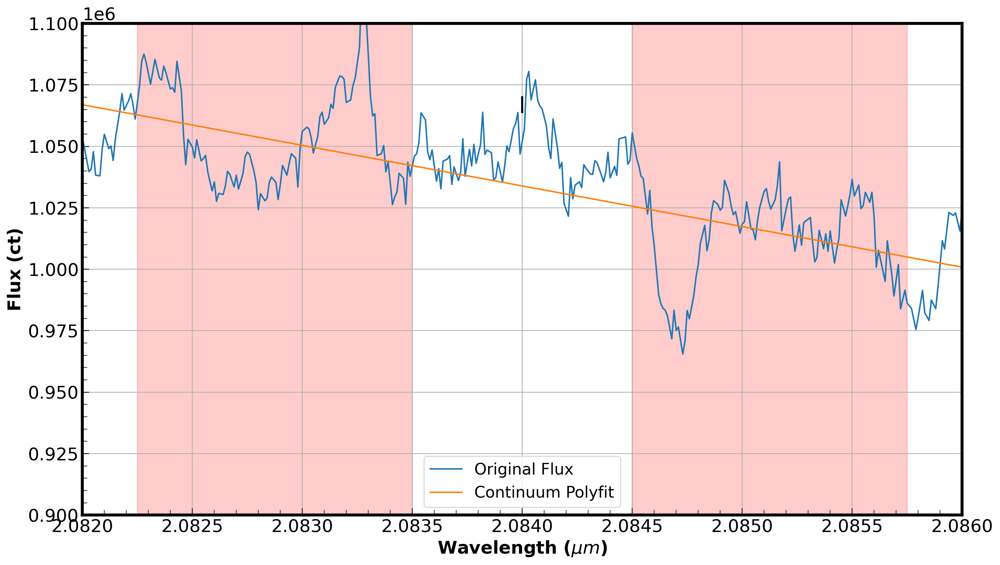

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.9e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
wavlen.iloc[wavemin_idx:wavemax_idx]

27514    2.24034
27515    2.24035
27516    2.24037
27517    2.24039
27518    2.24040
          ...   
27589    2.24158
27590    2.24160
27591    2.24161
27592    2.24163
27593    2.24165
Name: Wavelength, Length: 80, dtype: float64

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.iloc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.9],[10,200.,100.,1.1])

popt, pcov = curve_fit(f=gaussian_func,
                        xdata=wavlen.loc[contlo_min:conthi_max],
                        ydata=cont_norm.loc[contlo_min:conthi_max],
                        p0=init_params,
                        maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

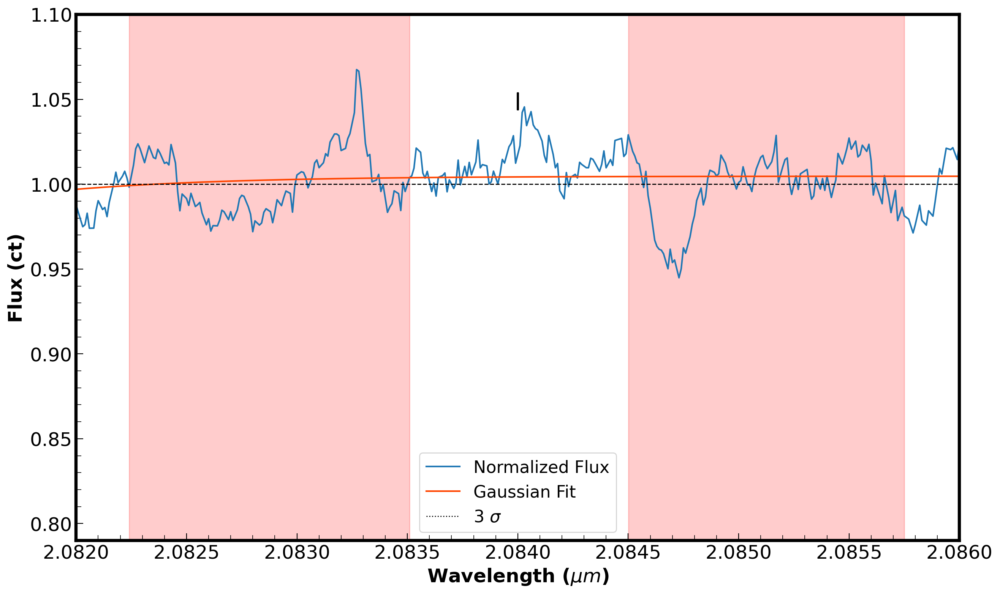

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0042828468844447
Relative Absorption: -0.004282846884444691
Half Max Flux: 1.0021414234422223
Half Relative Absorption: -0.0021414234422223455


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.00018297632623353748

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000013?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000004


# Local Continuum Fitting

In [78]:
# Central wavelength (micron)
wave_center = lines_wav[1]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(100*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2+(25*spec_res)
conthi_2 = wave_lim2+(100*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [139]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [140]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

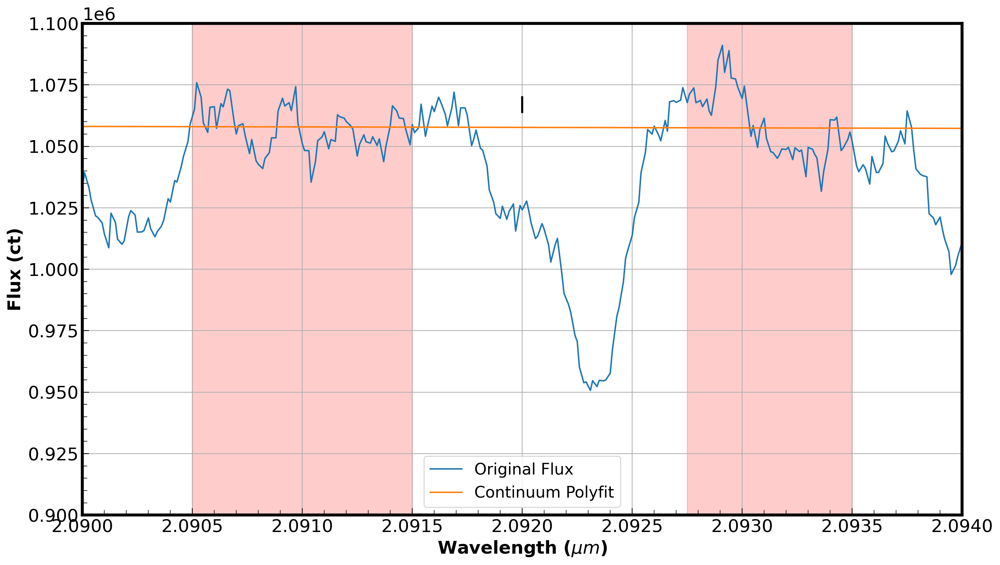

In [141]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.9e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [142]:
wavlen.loc[wavemin_idx:wavemax_idx].min()

2.0915

In [143]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -0.1,  wave_center, .01, 1.

# Bounds on the parameters
bound = ((-3.,wave_center-(25*spec_res),0,-1),(3,wave_center+(25*spec_res),10.,1.))

popt, pcov = curve_fit(f=gaussian_func,
                    xdata=wavlen.loc[contlo_min:conthi_max],
                    ydata=cont_norm.loc[contlo_min:conthi_max],
                    p0=init_params, bounds=bound,
                    maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-4.01113333e-05  2.09225000e+00  1.84630082e-04  1.00000000e+00]


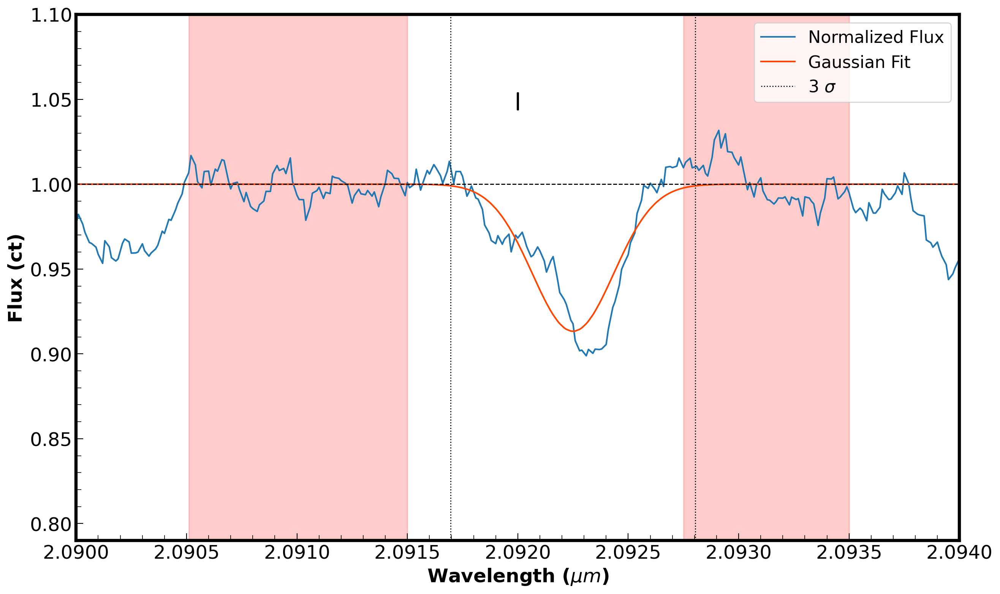

In [144]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

In [138]:
1-best_model.min()

0.0948781651170334

# Equivalent Width

A few different ways

In [131]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9348534256499894
Relative Absorption: 0.06514657435001059
Half Max Flux: 0.9674267128249947
Half Relative Absorption: 0.032573287175005294


In [132]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

2.8778360932051714e-05

In [133]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000044?


In [134]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000045


# Local Continuum Fitting

In [159]:
# Central wavelength (micron)
wave_center = lines_wav[2]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1-(50*spec_res)

conthi_1 = wave_lim2+(50*spec_res)
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [160]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [161]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

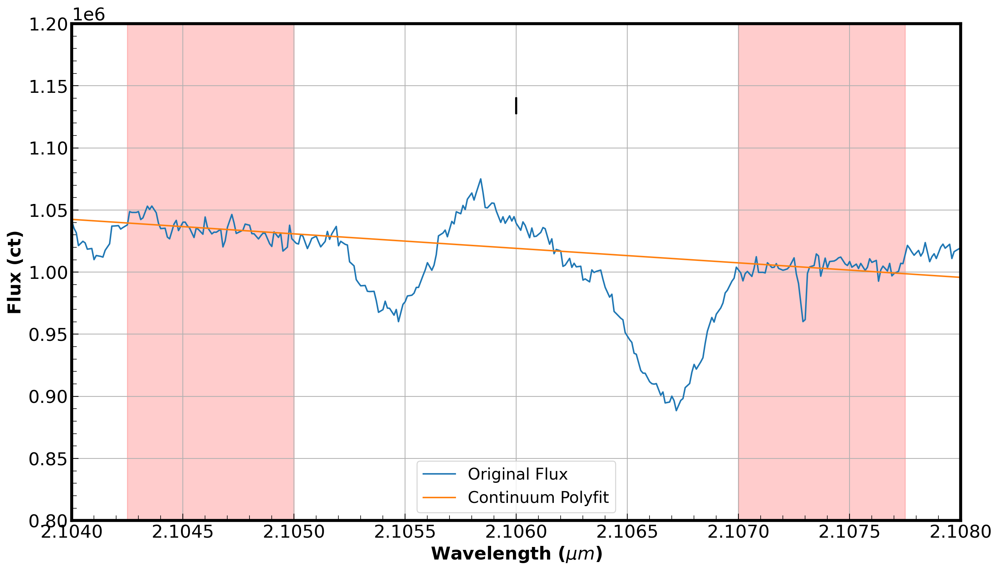

In [162]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.8e6,1.2e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [169]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = 0.5,  wave_center, .01, 0
# Bounds on the parameters

bound = ((-3.,wave_center-(25*spec_res),0,-1),(3,wave_center+(25*spec_res),10.,1.))

popt, pcov = curve_fit(f=gaussian_func,
                    xdata=wavlen.loc[contlo_min:conthi_max],
                    ydata=cont_norm.loc[contlo_min:conthi_max],
                    p0=init_params, bounds=bound,
                    maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [1.30366116 2.10575    0.93656673 0.43028678]


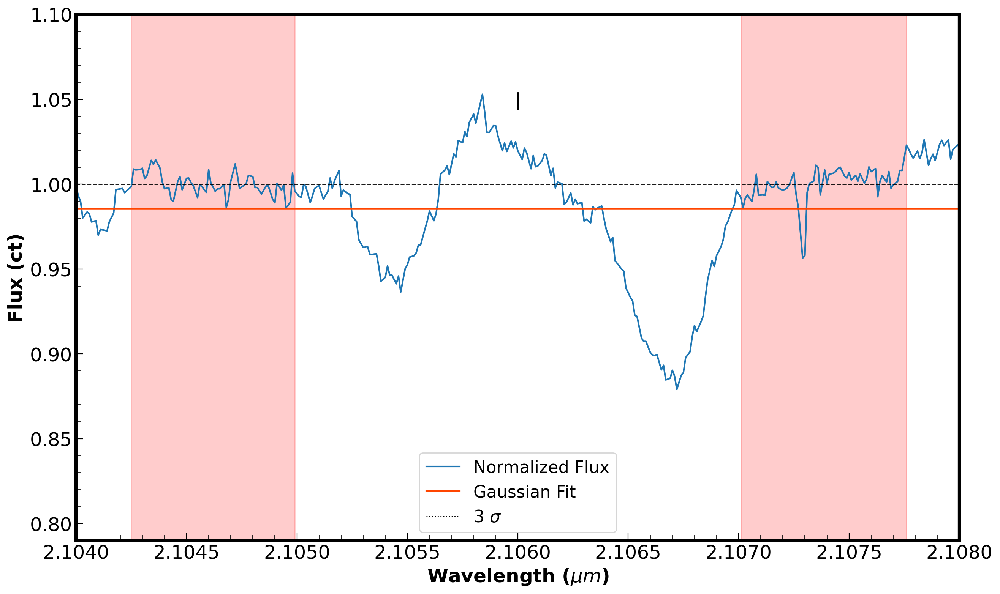

In [170]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [68]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9953764208539866
Relative Absorption: 0.004623579146013412
Half Max Flux: 0.9976882104269933
Half Relative Absorption: 0.002311789573006706


In [69]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.004584992844347119

In [70]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000020?


In [71]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000004


# Local Continuum Fitting

In [72]:
# Central wavelength (micron)
wave_center = lines_wav[3]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [73]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [74]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

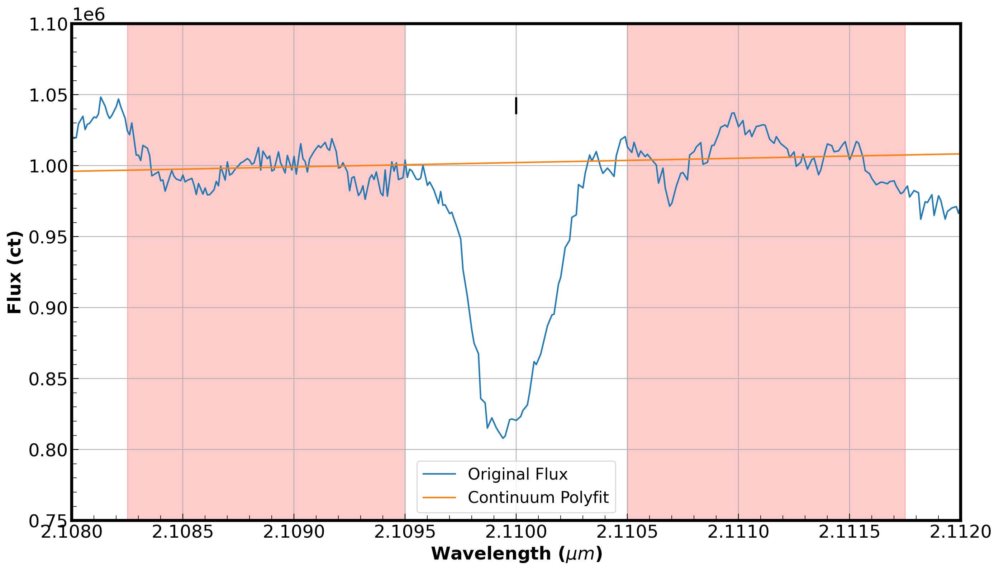

In [75]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.75e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [76]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

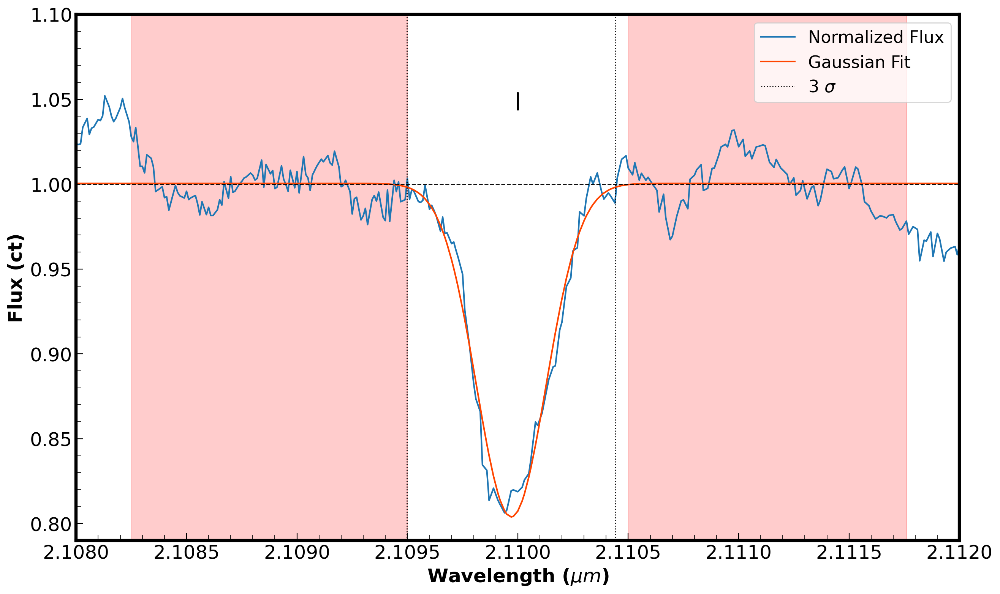

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.8073177251041468
Relative Absorption: 0.1926822748958532
Half Max Flux: 0.9036588625520734
Half Relative Absorption: 0.0963411374479266


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

8.736696533909115e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000076?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000077


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[4]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

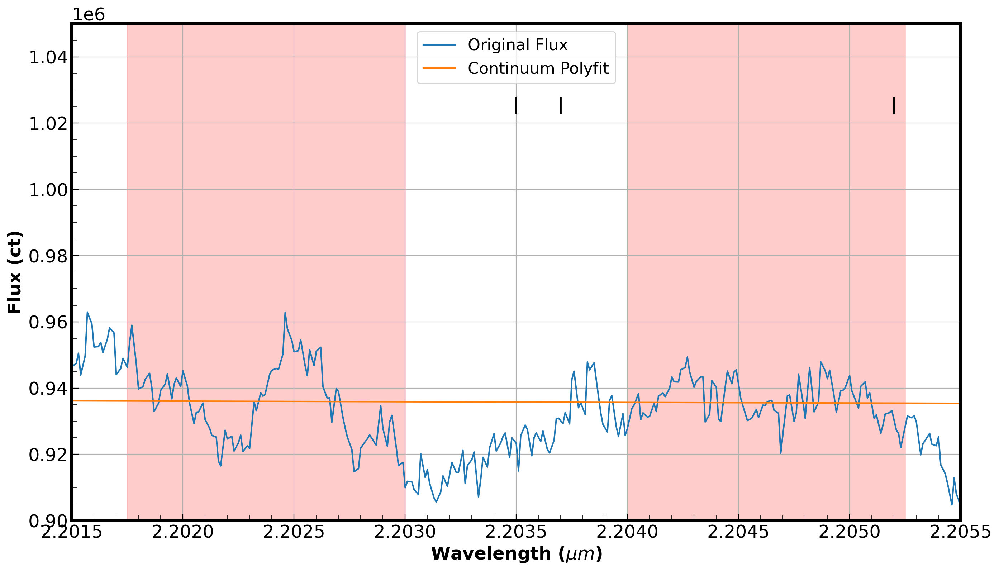

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9e6,1.05e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [1.07753720e-05 2.20453168e+00 4.24951667e-04 9.93358709e-01]


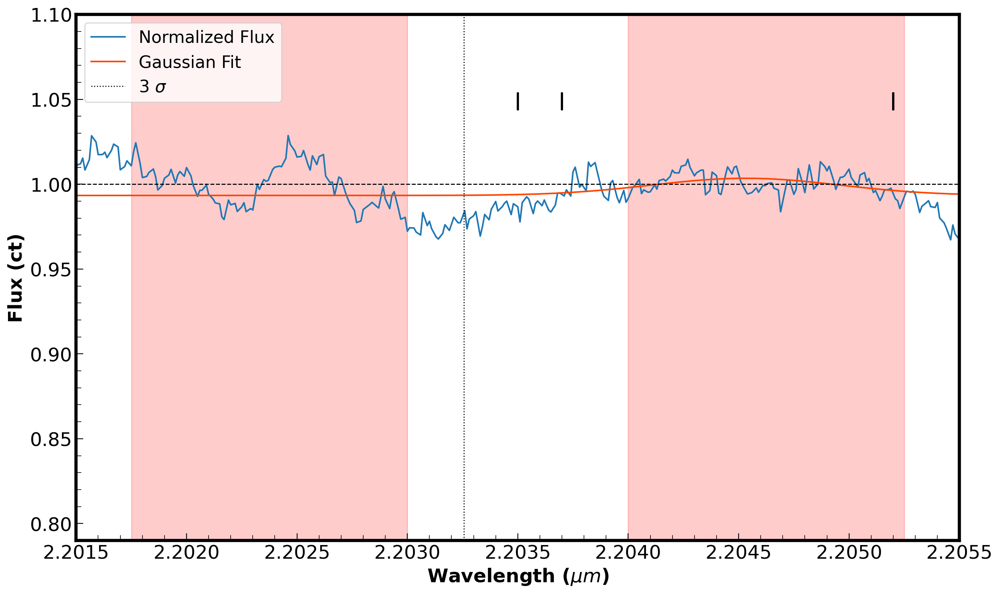

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9938897656019756
Relative Absorption: 0.006110234398024383
Half Max Flux: 0.9969448828009878
Half Relative Absorption: 0.0030551171990121917


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

1.4373148587578362e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000013?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000006


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[5]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

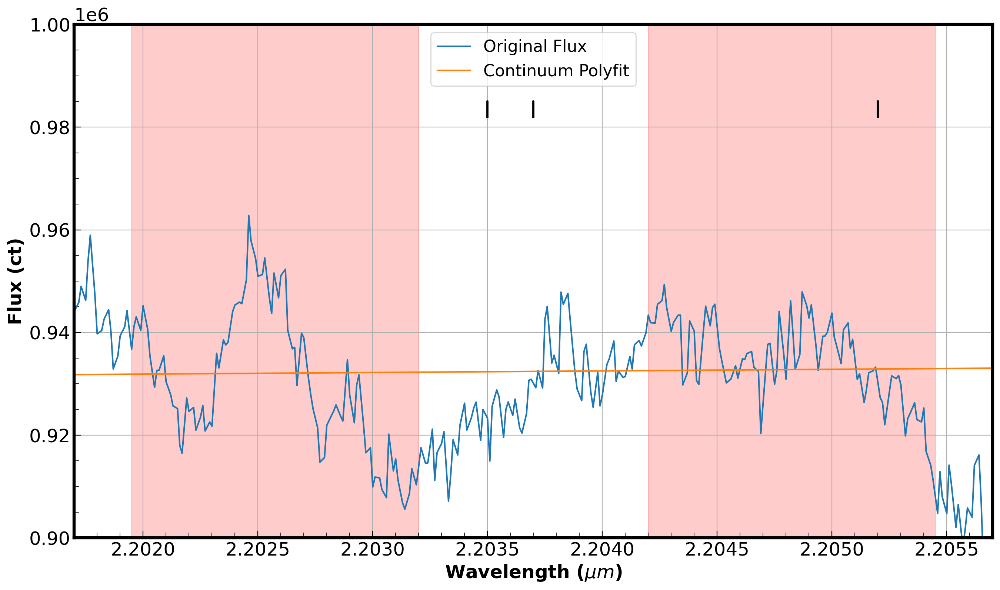

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.9e6,1.0e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [1.22335162e-05 2.20446552e+00 4.11932962e-04 9.95218535e-01]


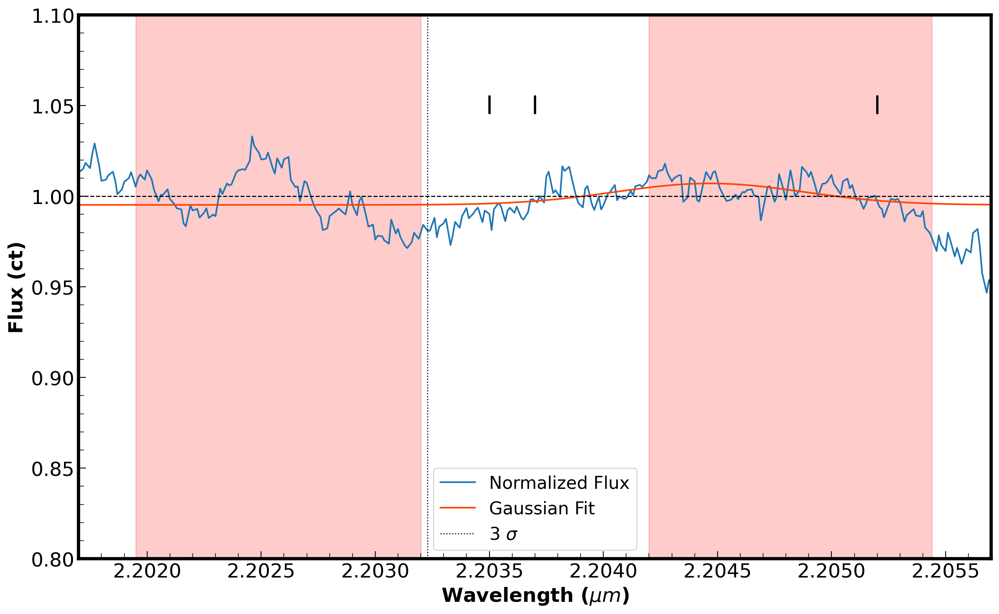

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.8,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9972331793085819
Relative Absorption: 0.0027668206914180926
Half Max Flux: 0.9986165896542909
Half Relative Absorption: 0.0013834103457090463


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

1.6960210053270947e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000005?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000002


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[6]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

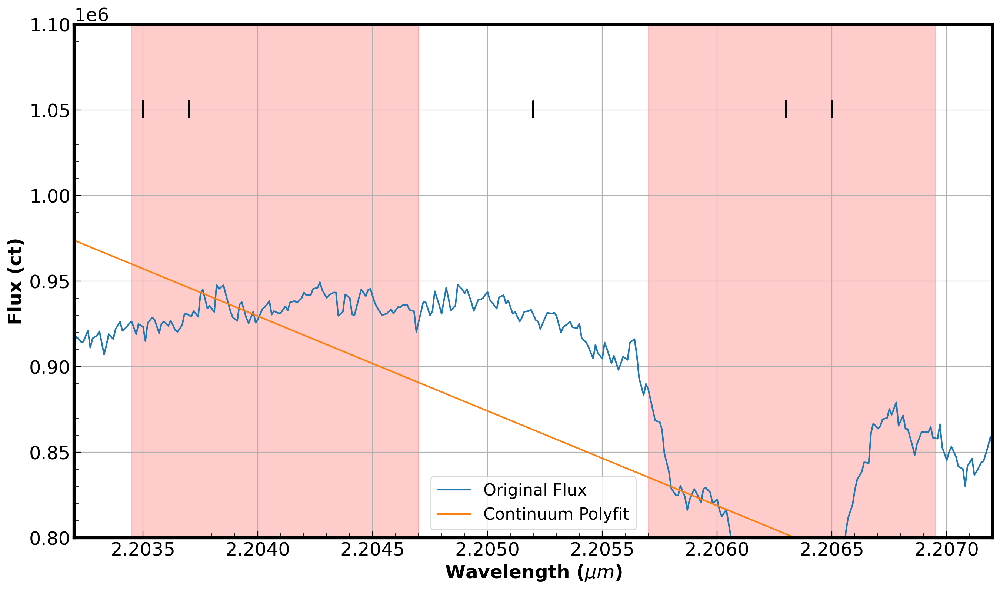

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.8e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.21884315e+00  2.19784390e+00  1.32258314e-03  1.02753749e+00]


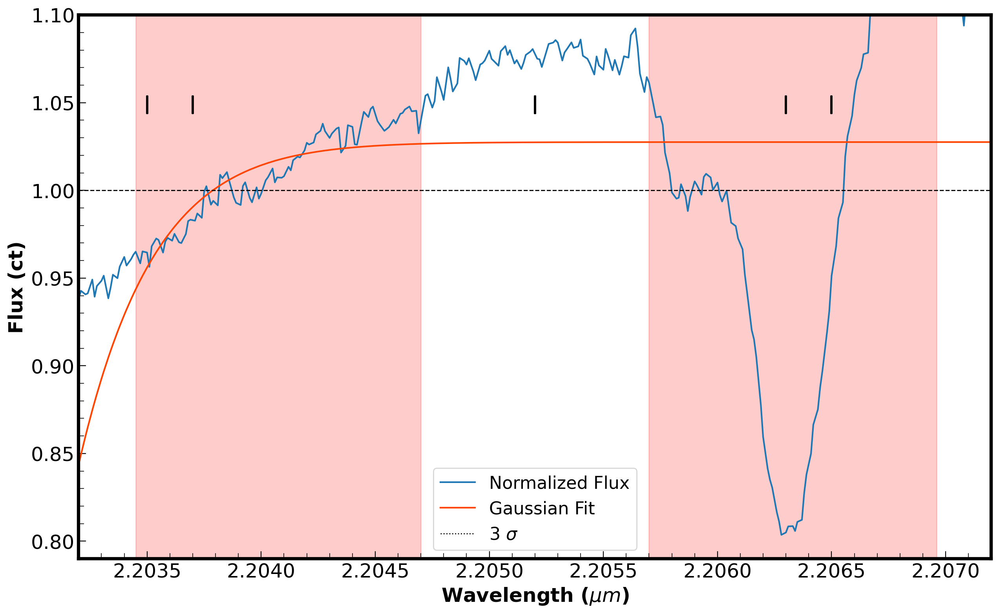

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0274144921435941
Relative Absorption: -0.02741449214359415
Half Max Flux: 1.013707246071797
Half Relative Absorption: -0.013707246071797075


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.00023149452865061512

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000072?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000027


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[7]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

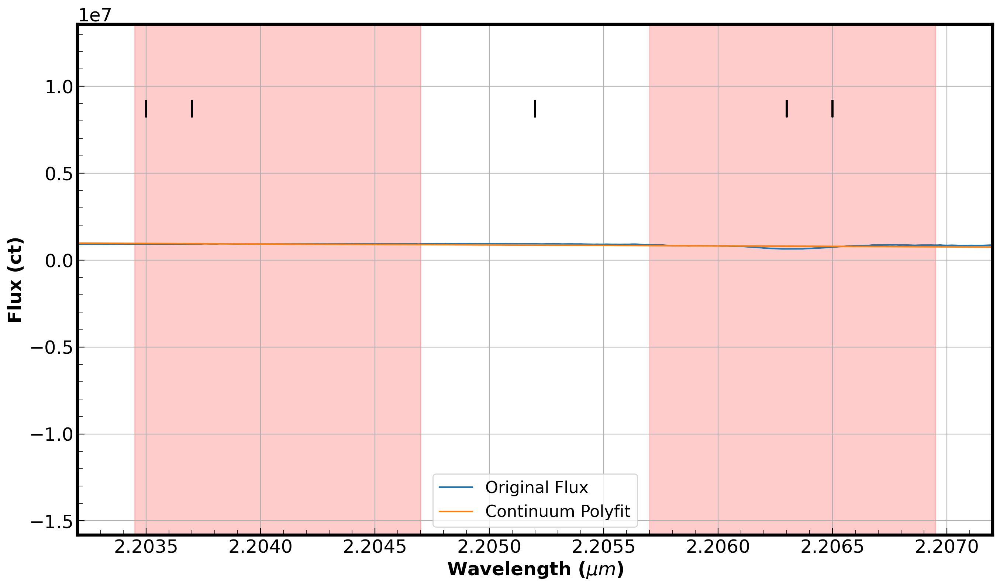

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.21884315e+00  2.19784390e+00  1.32258314e-03  1.02753749e+00]


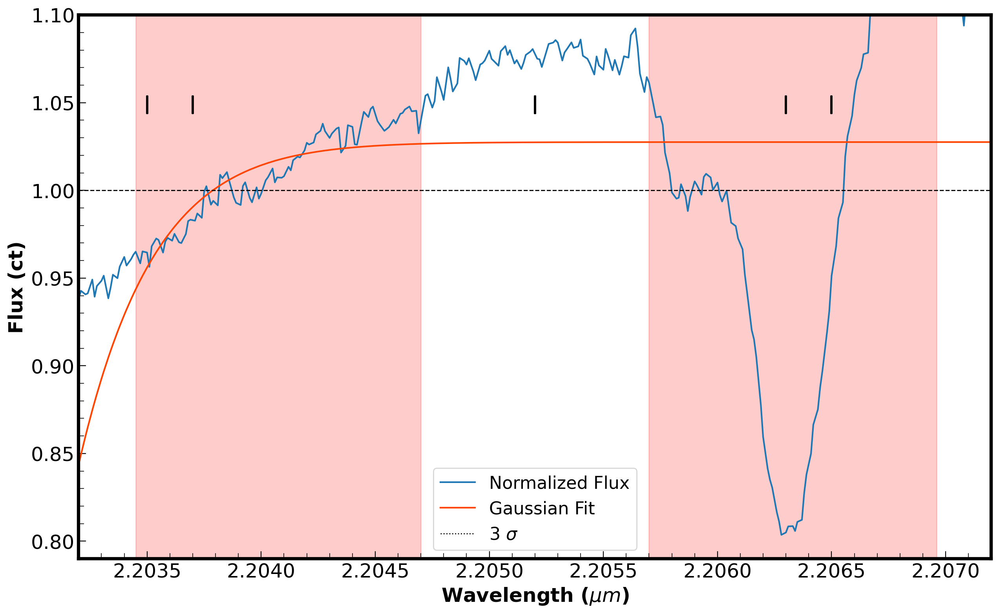

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0274144921435941
Relative Absorption: -0.02741449214359415
Half Max Flux: 1.013707246071797
Half Relative Absorption: -0.013707246071797075


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.00023149452865061512

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000072?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000027


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[8]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

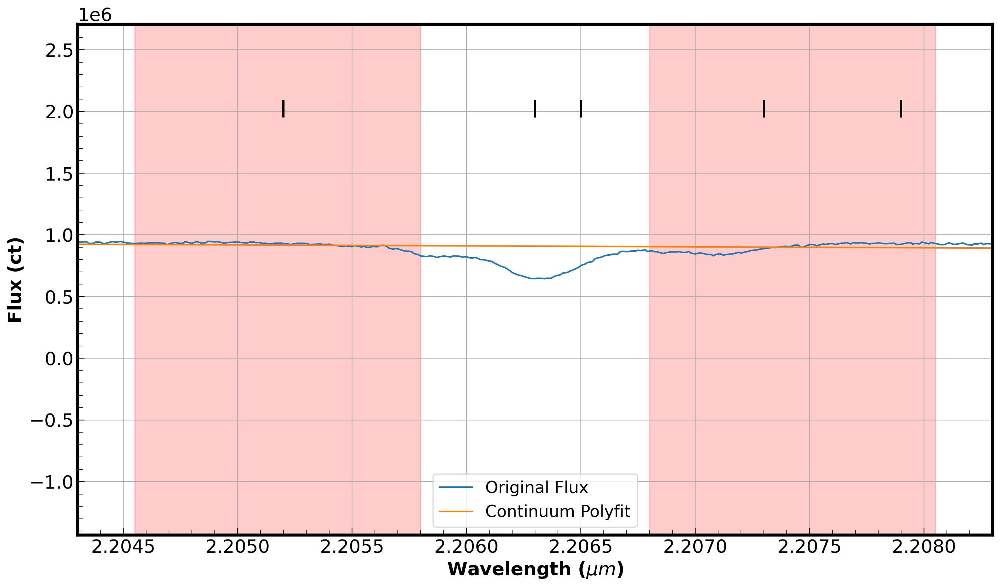

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-1.68505654e-04  2.20629901e+00  2.63004954e-04  1.00587100e+00]


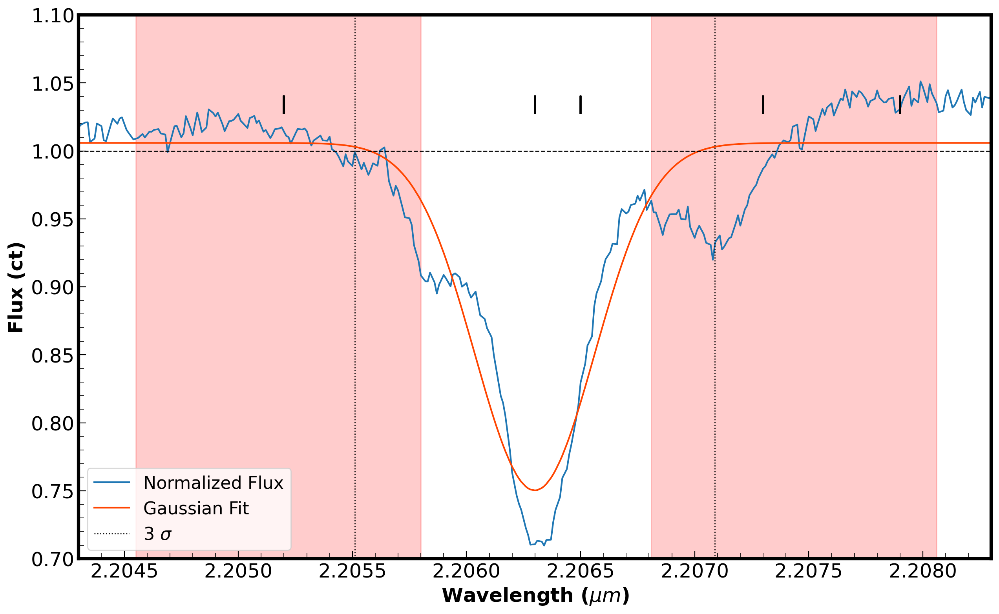

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.7,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.7502729663525833
Relative Absorption: 0.24972703364741666
Half Max Flux: 0.8751364831762917
Half Relative Absorption: 0.12486351682370833


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

0.0002683969669928457

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000149?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000153


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[9]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

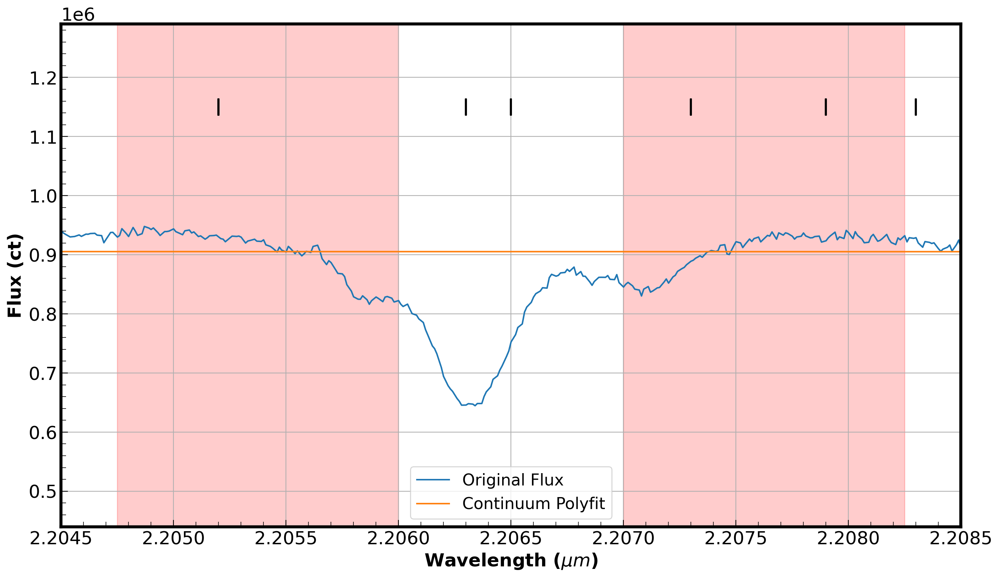

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-1.66891724e-04  2.20630502e+00  2.59285911e-04  1.00842199e+00]


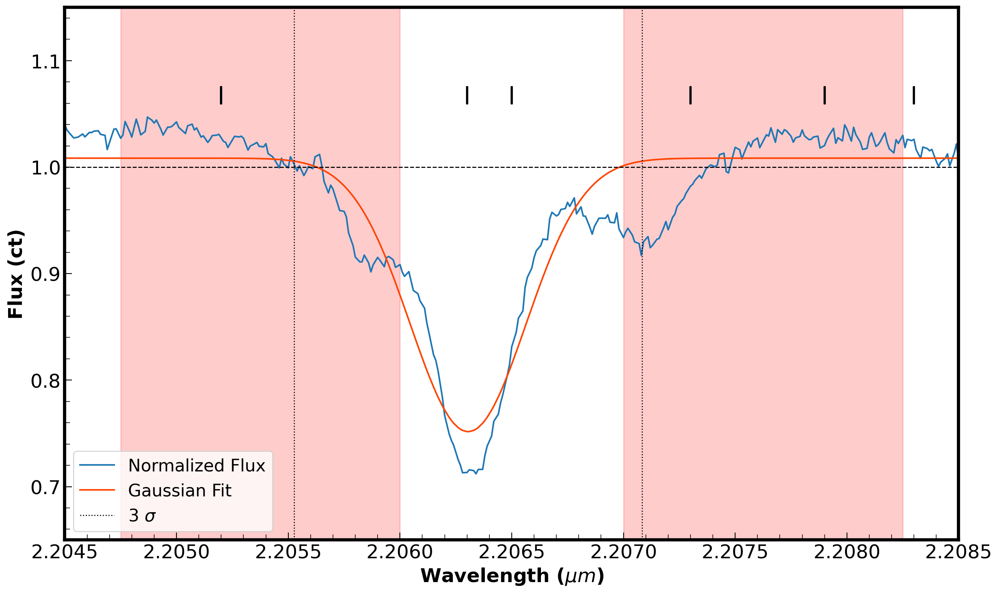

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.65,1.15)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.814934883523029
Relative Absorption: 0.185065116476971
Half Max Flux: 0.9074674417615145
Half Relative Absorption: 0.0925325582384855


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

0.00013188219852279322

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width: {ew1:.7f}?")

Equivalent Width: 0.0001380?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width: {ew2:.7f}")

Equivalent Width: 0.0001378


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[10]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

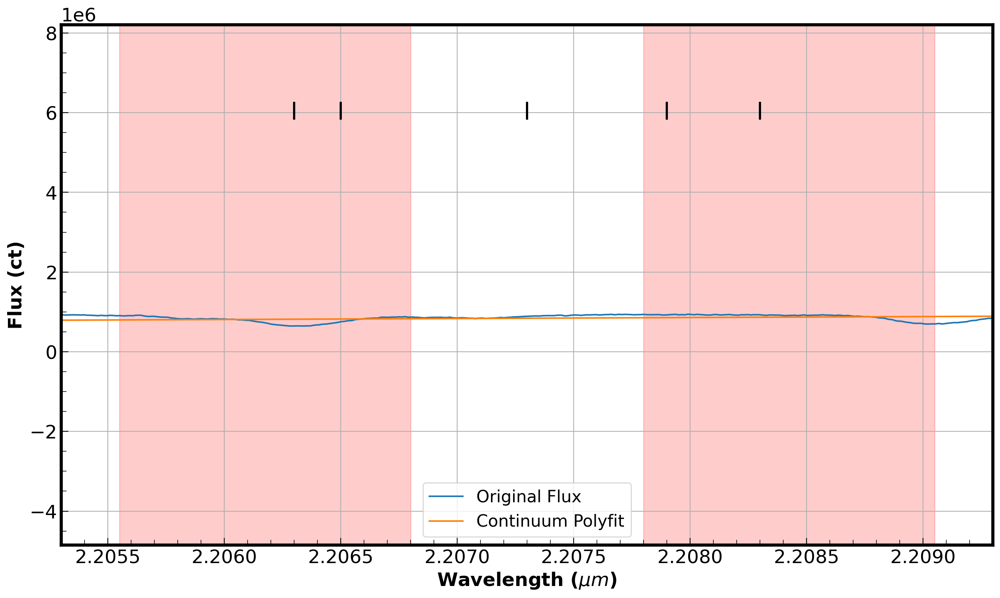

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-9.38869077e-05  2.20632406e+00  1.45298544e-04  1.04208276e+00]


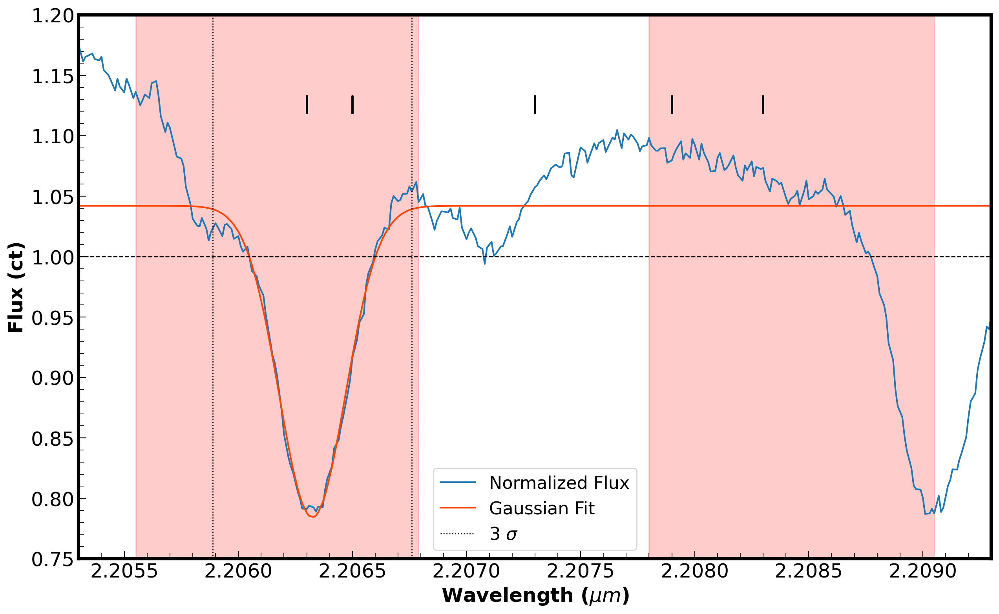

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.75,1.2)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0420827564242736
Relative Absorption: -0.042082756424273615
Half Max Flux: 1.0210413782121368
Half Relative Absorption: -0.021041378212136808


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-1.9807170370242672e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000056?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000042


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[11]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

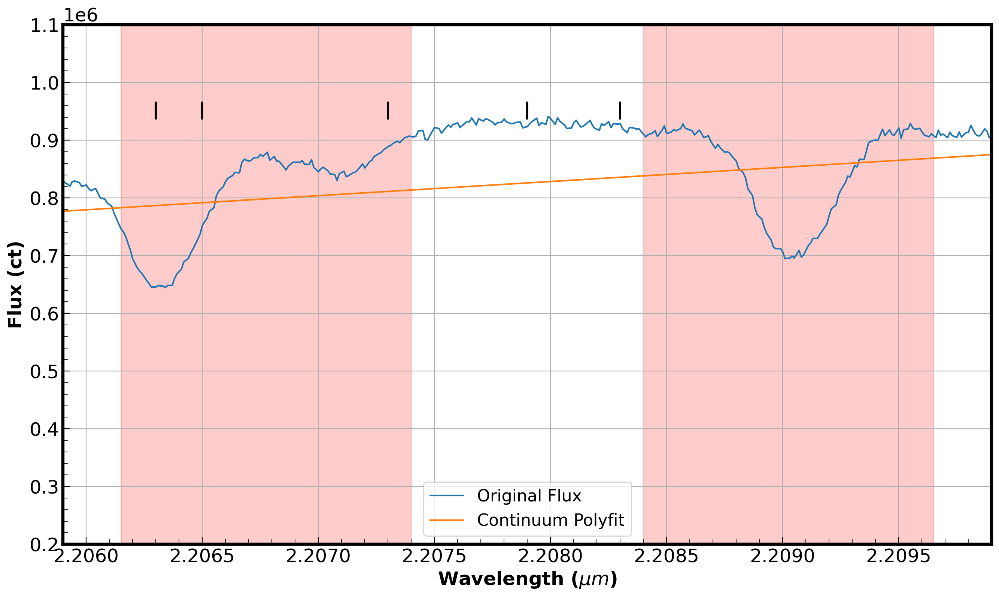

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.2e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [3.60213313e-04 2.20775320e+00 6.73895420e-04 9.32691648e-01]


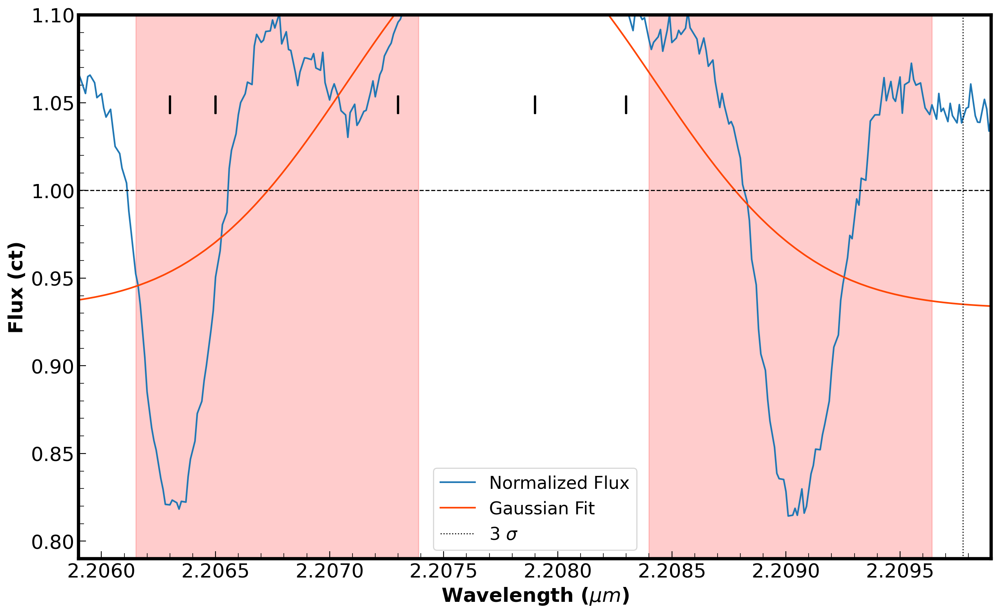

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.1409359065289546
Relative Absorption: -0.1409359065289546
Half Max Flux: 1.0704679532644774
Half Relative Absorption: -0.0704679532644773


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.0001785043712085406

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000122?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000125


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = 2.209

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

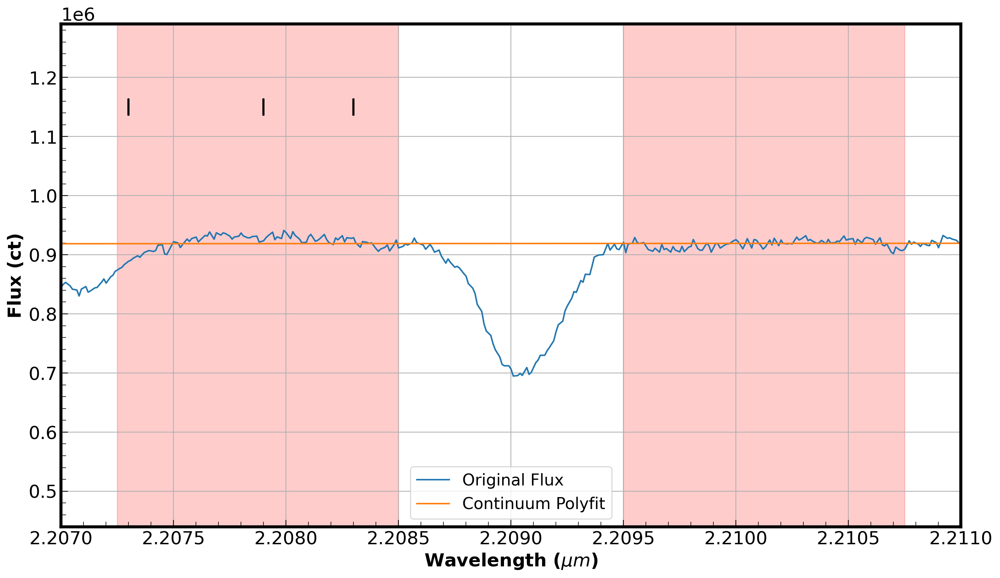

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=5000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-9.94386724e-05  2.20905174e+00  1.61322349e-04  1.00036955e+00]


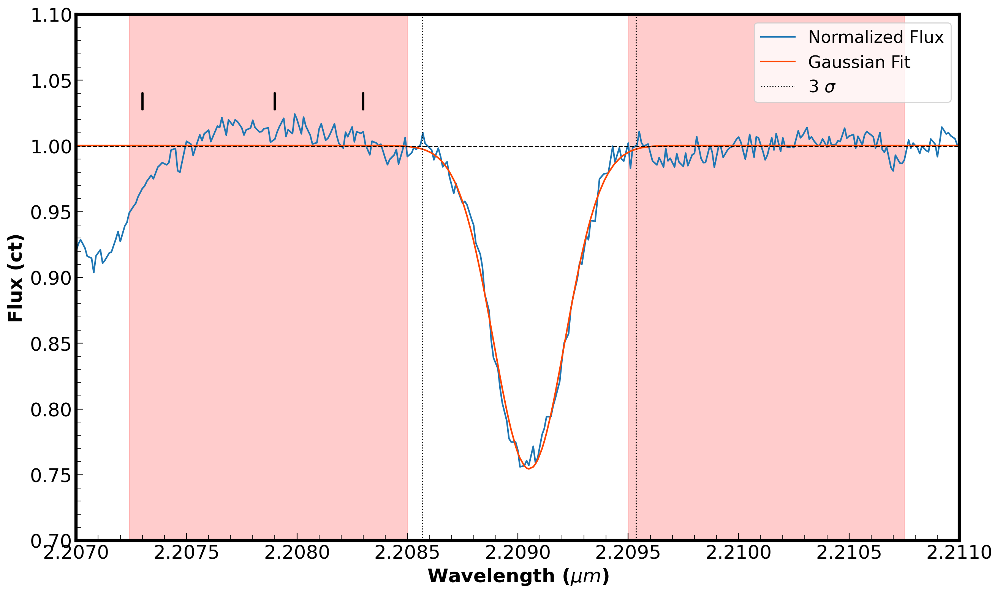

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.7,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.7667448770160306
Relative Absorption: 0.23325512298396944
Half Max Flux: 0.8833724385080153
Half Relative Absorption: 0.11662756149198472


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-2.5460279472429184e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000062?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000040


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[13]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

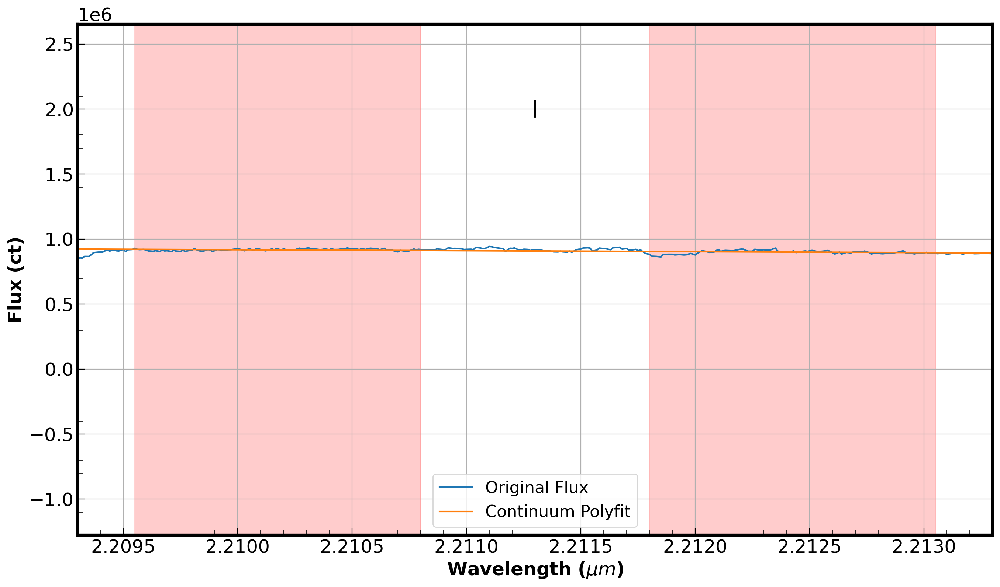

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [ 0.05812076  2.21130366  0.01279562 -0.8025987 ]


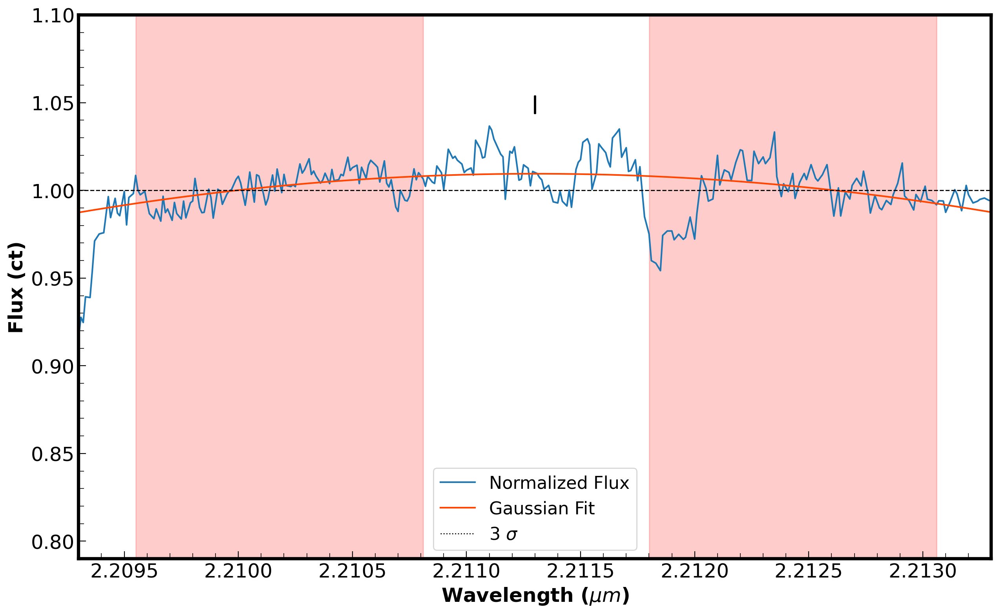

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0094916087093562
Relative Absorption: -0.00949160870935617
Half Max Flux: 1.0047458043546782
Half Relative Absorption: -0.004745804354678085


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.00030518998800035957

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000013?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000009


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[14]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

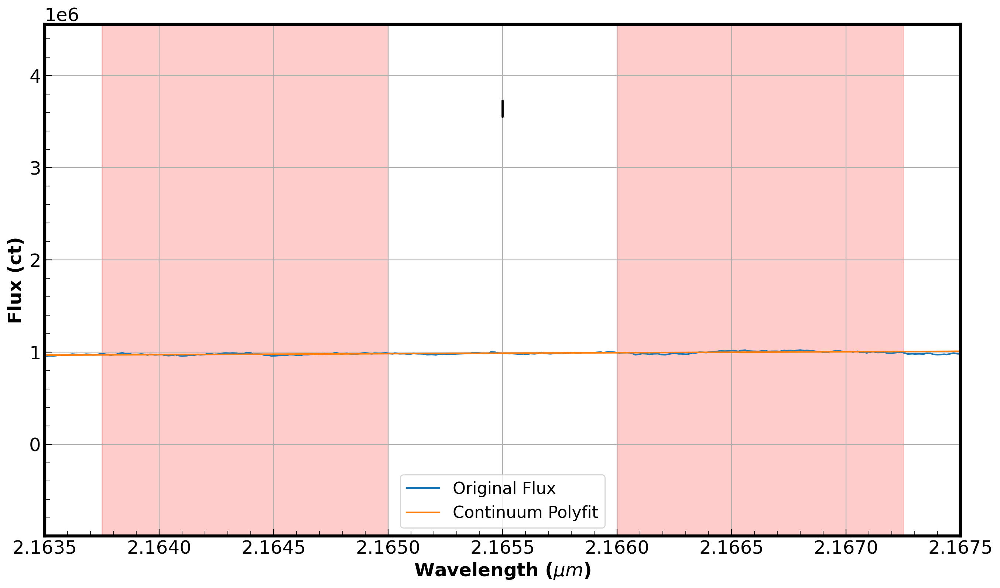

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-9.14845851e-06  2.16545764e+00  6.39648924e-04  1.00196926e+00]


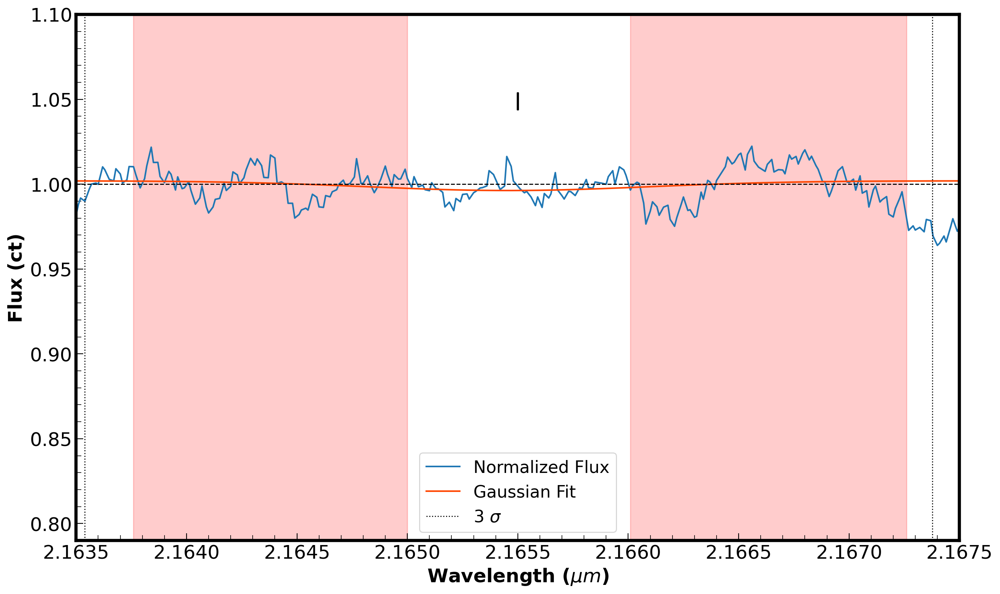

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9962759038896303
Relative Absorption: 0.0037240961103697234
Half Max Flux: 0.9981379519448151
Half Relative Absorption: 0.0018620480551848617


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

1.7944012302680437e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000002?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000003


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[15]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

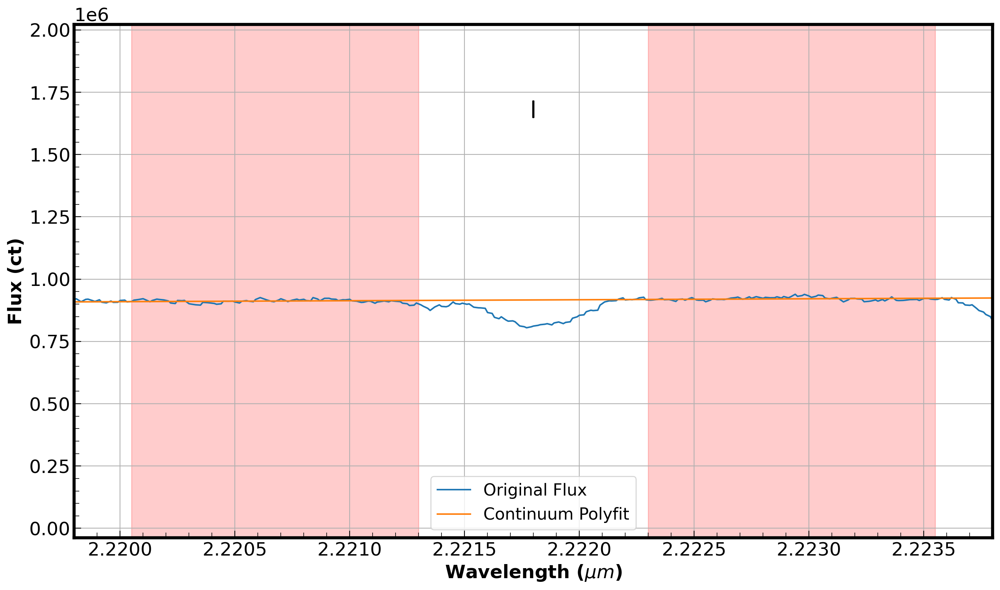

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-4.97140339e-05  2.22181343e+00  1.69306993e-04  9.99630082e-01]


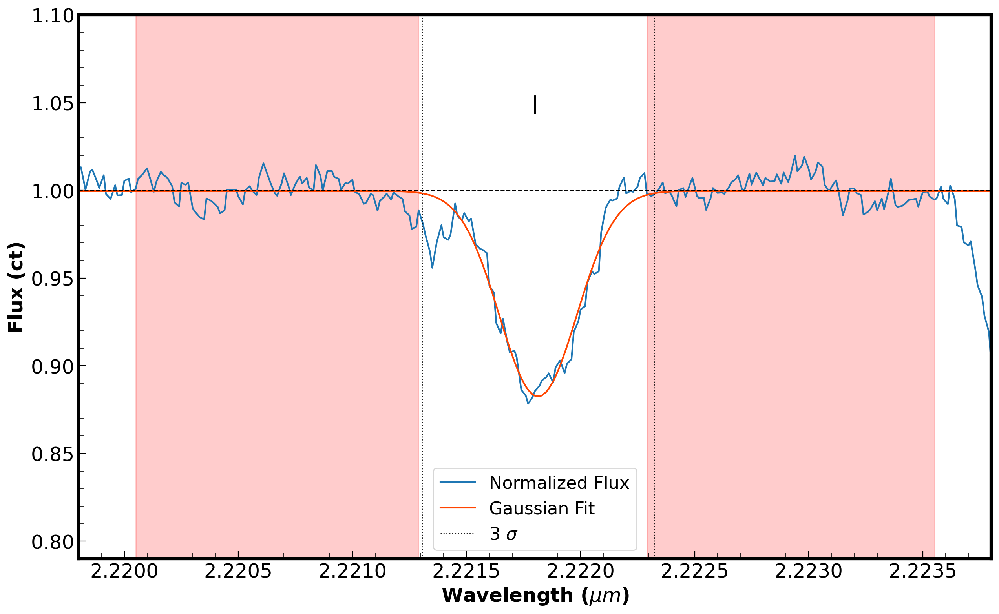

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.8828502112944828
Relative Absorption: 0.11714978870551718
Half Max Flux: 0.9414251056472414
Half Relative Absorption: 0.05857489435275859


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

5.4800588082181555e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000051?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000050


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[16]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

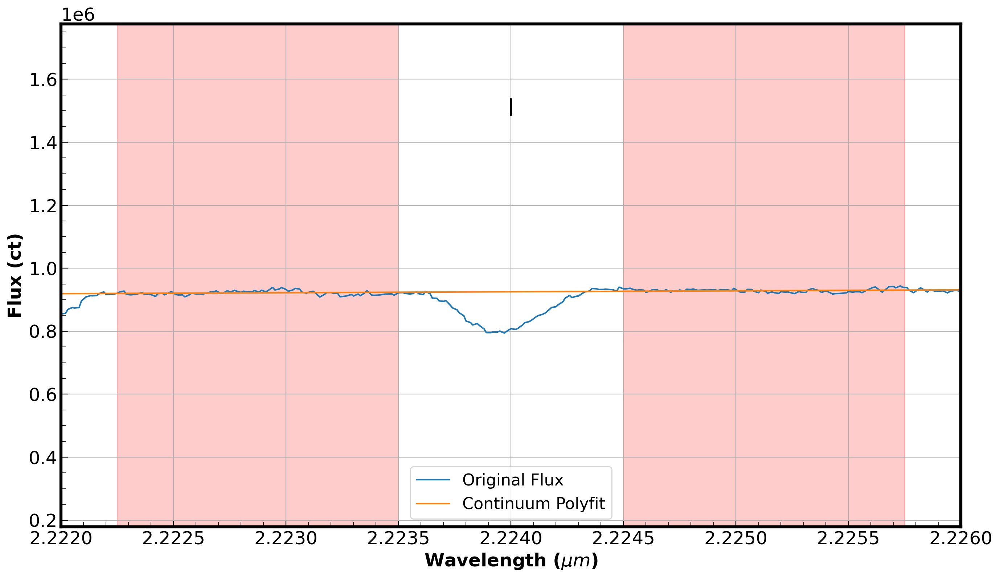

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-5.58531639e-05  2.22395640e+00  1.56238309e-04  1.00068373e+00]


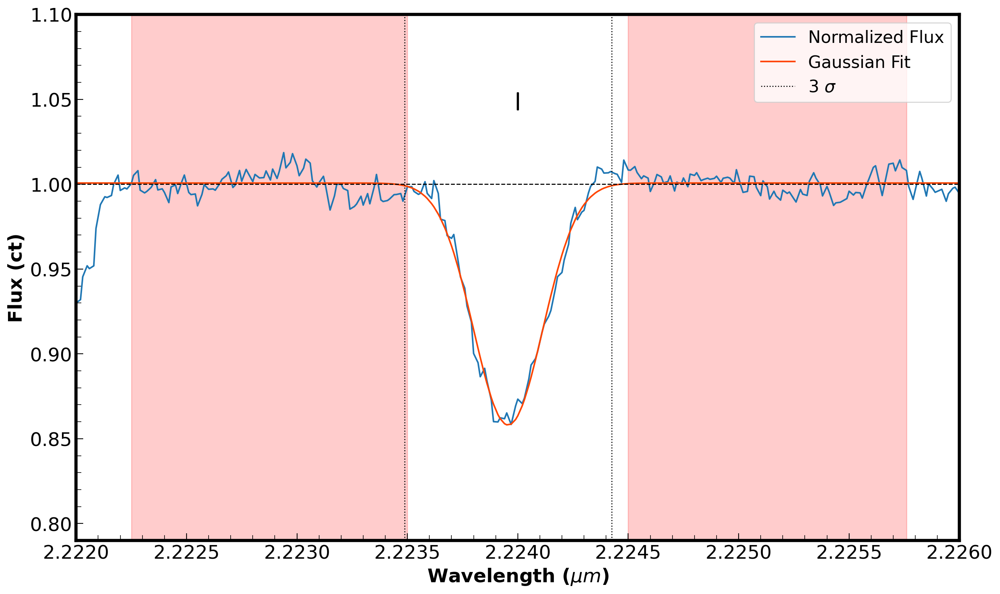

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.8635133456709746
Relative Absorption: 0.1364866543290254
Half Max Flux: 0.9317566728354874
Half Relative Absorption: 0.0682433271645127


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

5.680543394819767e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.7f}?")

Equivalent Width for Ti-2.224: 0.000053?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.7f}")

Equivalent Width for Ti-2.224: 0.000055


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[17]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

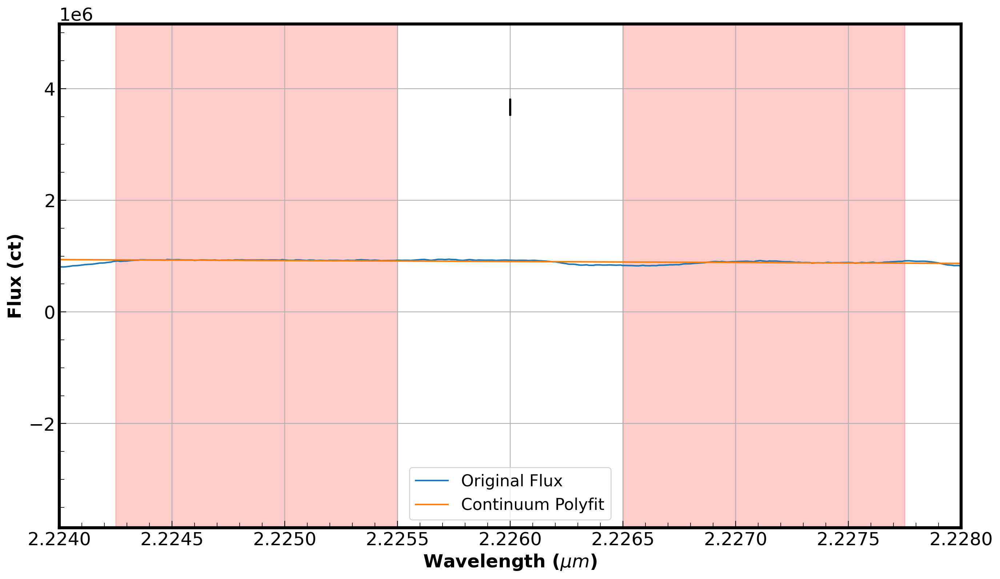

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-4.59862111e-05  2.22652075e+00  1.95337436e-04  1.01320700e+00]


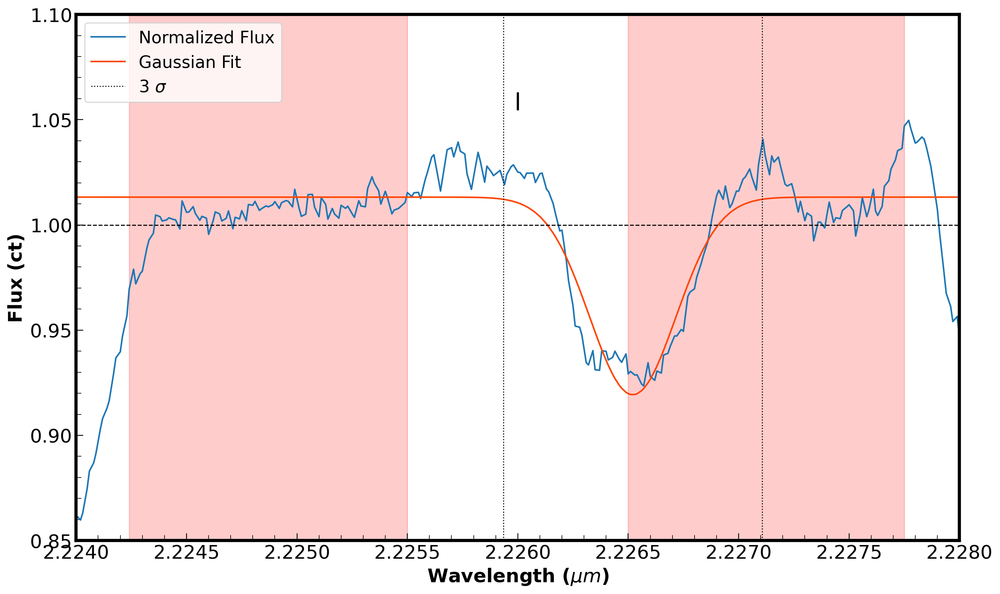

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.85,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0105148652184495
Relative Absorption: -0.010514865218449465
Half Max Flux: 1.0052574326092247
Half Relative Absorption: -0.0052574326092247325


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-1.1987210144721552e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000000?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000008


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[18]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

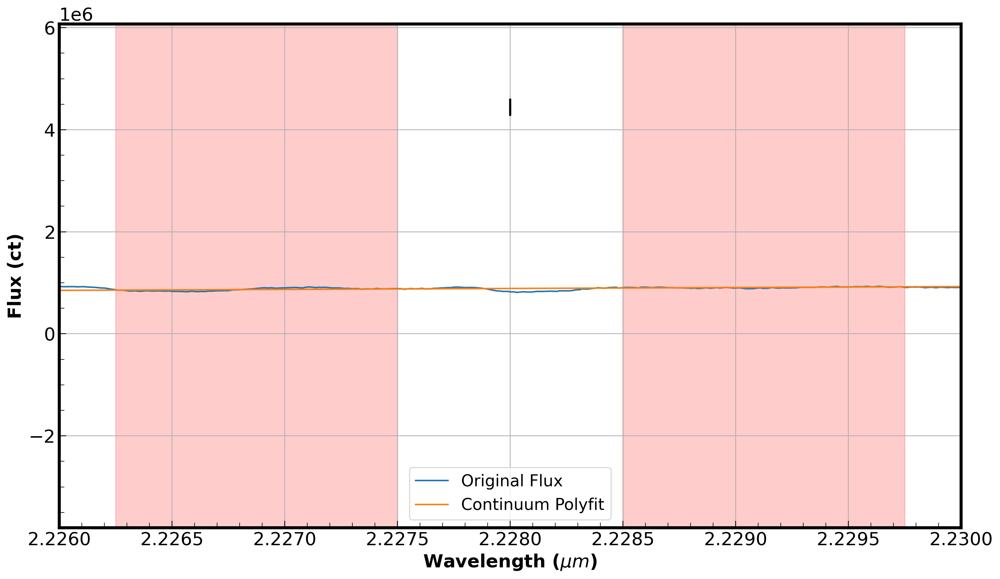

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.72241517e-05  2.22810846e+00  1.23658018e-04  1.00186378e+00]


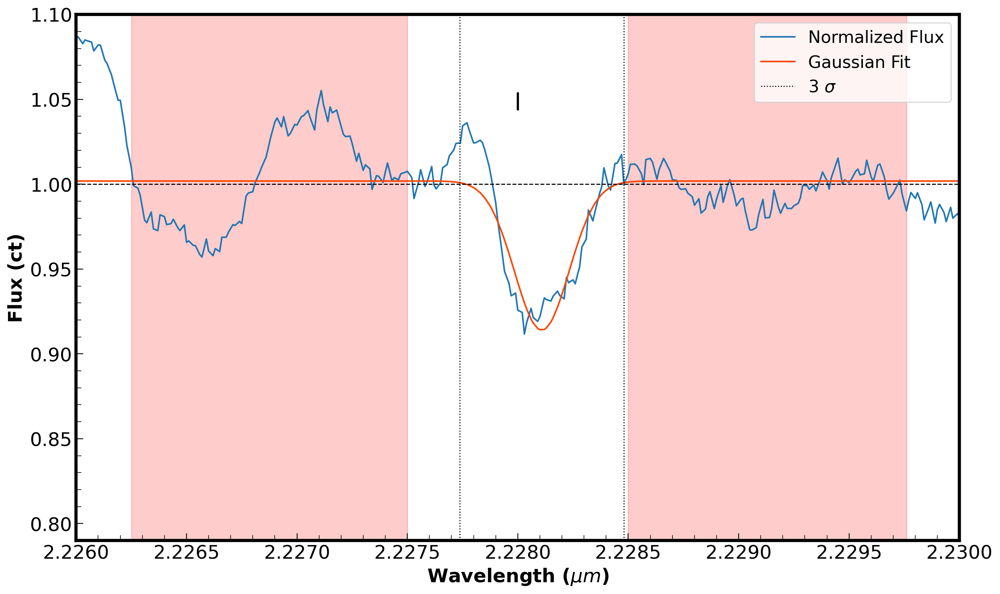

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
        # ax.text(x=lines_wav[ii],y=1.1,s=lines_str[ii][0:2],ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9421201720084736
Relative Absorption: 0.057879827991526356
Half Max Flux: 0.9710600860042369
Half Relative Absorption: 0.028939913995763178


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

2.4867962211908876e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000020?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000025


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[19]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

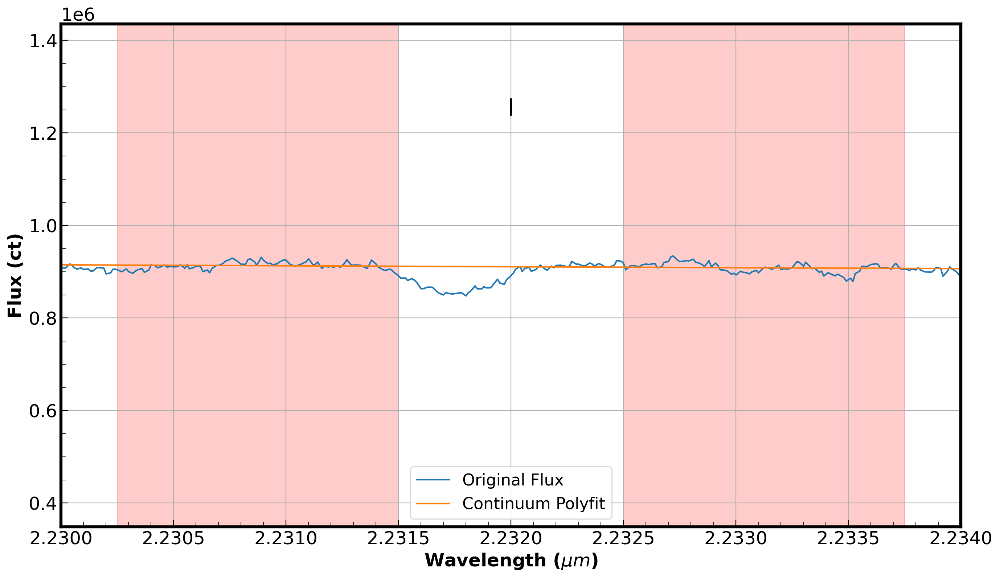

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=5000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.74839395e-05  2.23175279e+00  1.60634164e-04  1.00113136e+00]


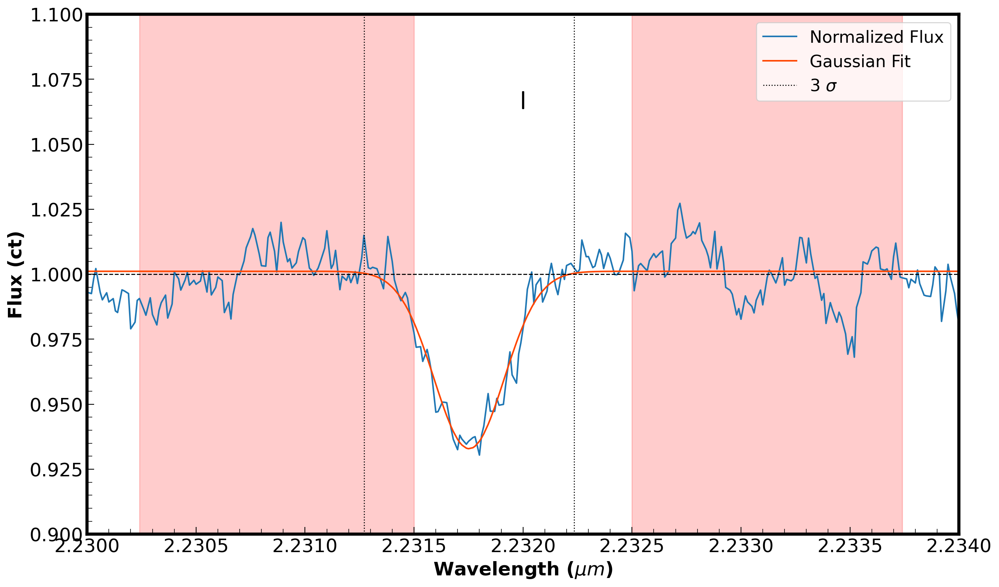

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9821712668941063
Relative Absorption: 0.017828733105893724
Half Max Flux: 0.9910856334470531
Half Relative Absorption: 0.008914366552946862


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

6.350686942107172e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000024?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000025


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[20]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

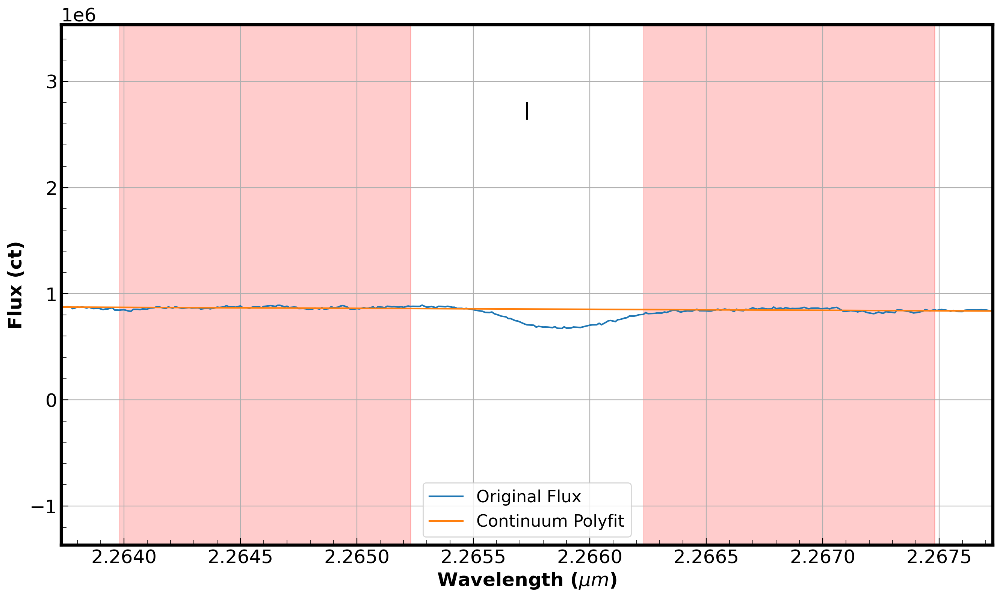

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=5000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [7.18427807e-05 2.26474401e+00 4.12895030e-04 9.52507693e-01]


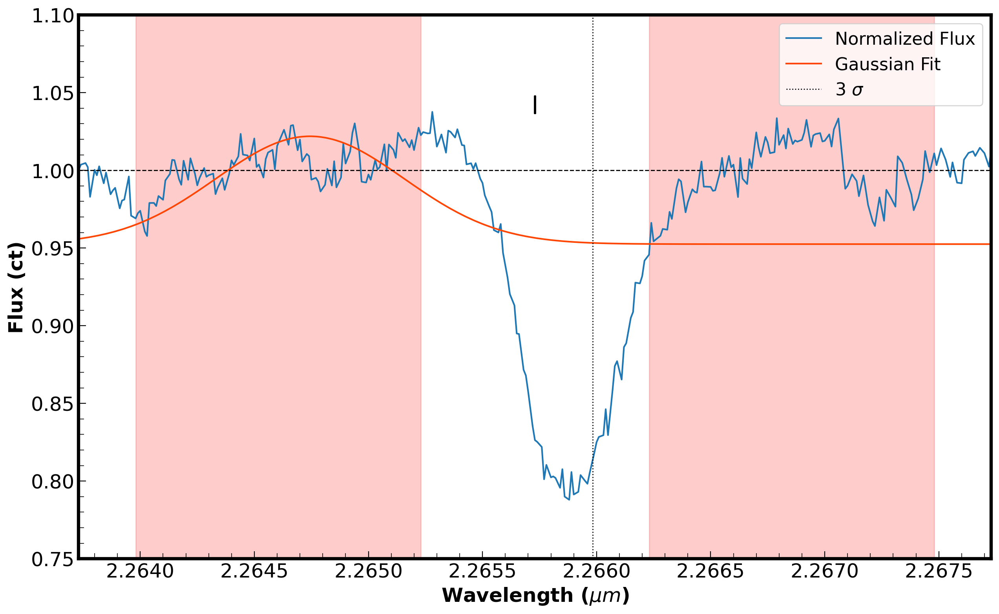

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.75,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9565203185692648
Relative Absorption: 0.04347968143073522
Half Max Flux: 0.9782601592846324
Half Relative Absorption: 0.02173984071536761


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

0.00021748624662279995

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000093?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000039


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[21]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

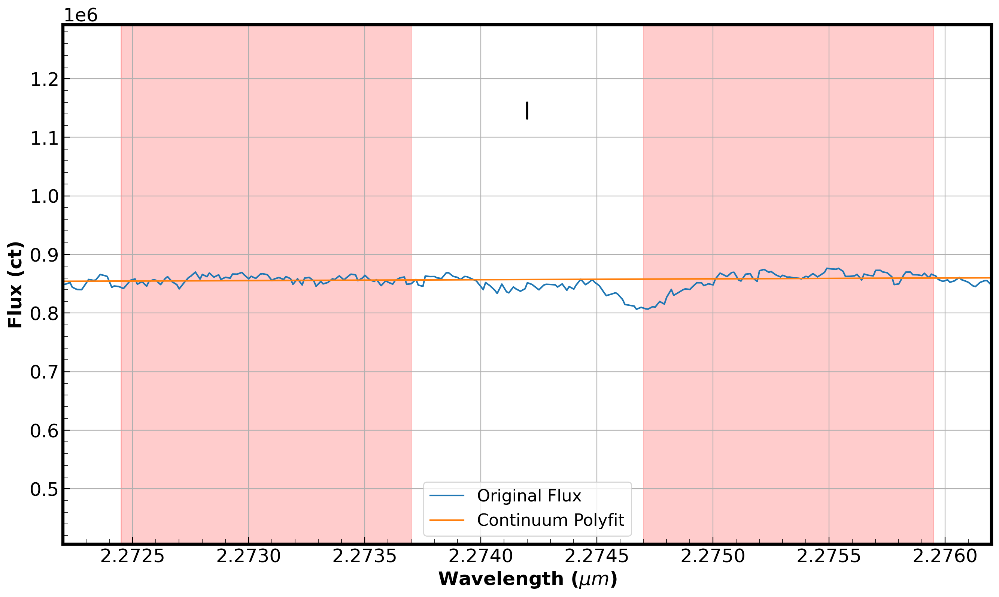

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=5000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-1.86393227e-05  2.27469912e+00  1.29679195e-04  1.00138310e+00]


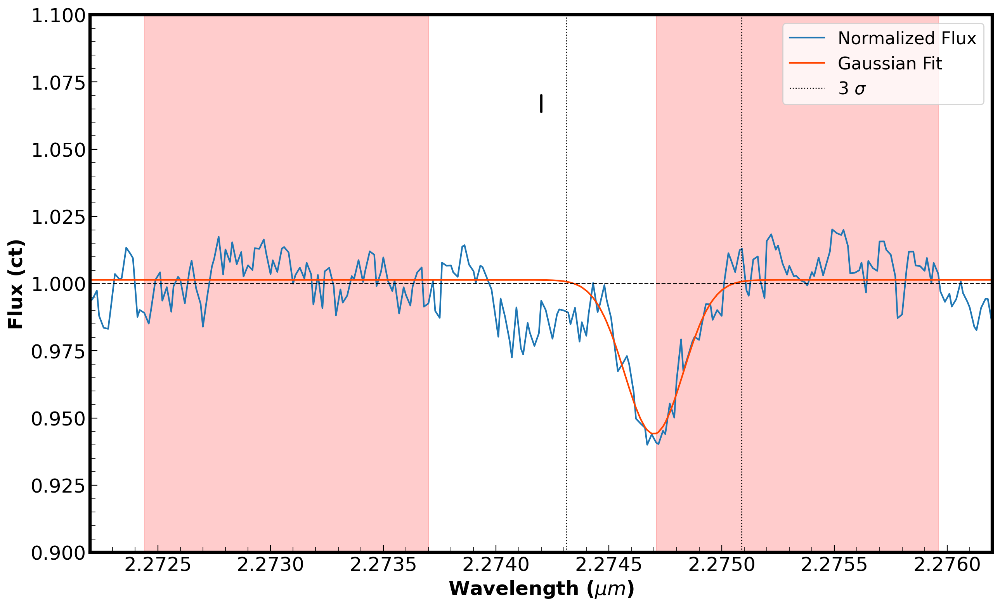

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0013482935854978
Relative Absorption: -0.0013482935854978173
Half Max Flux: 1.000674146792749
Half Relative Absorption: -0.0006741467927489087


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

2.084146345064742e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000014?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000009


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[22]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

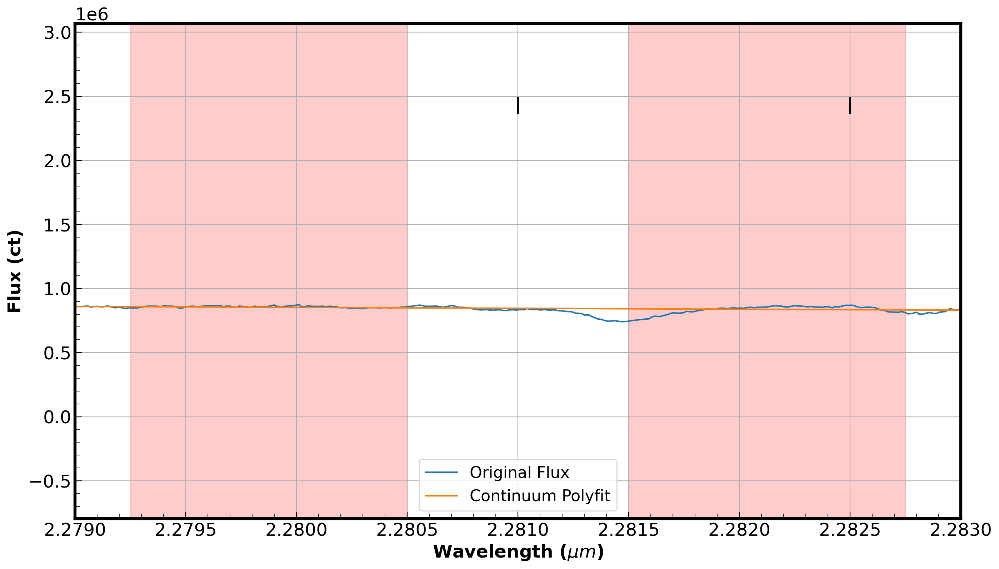

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=5000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-5.27721707e-05  2.28147522e+00  1.72713412e-04  1.00802896e+00]


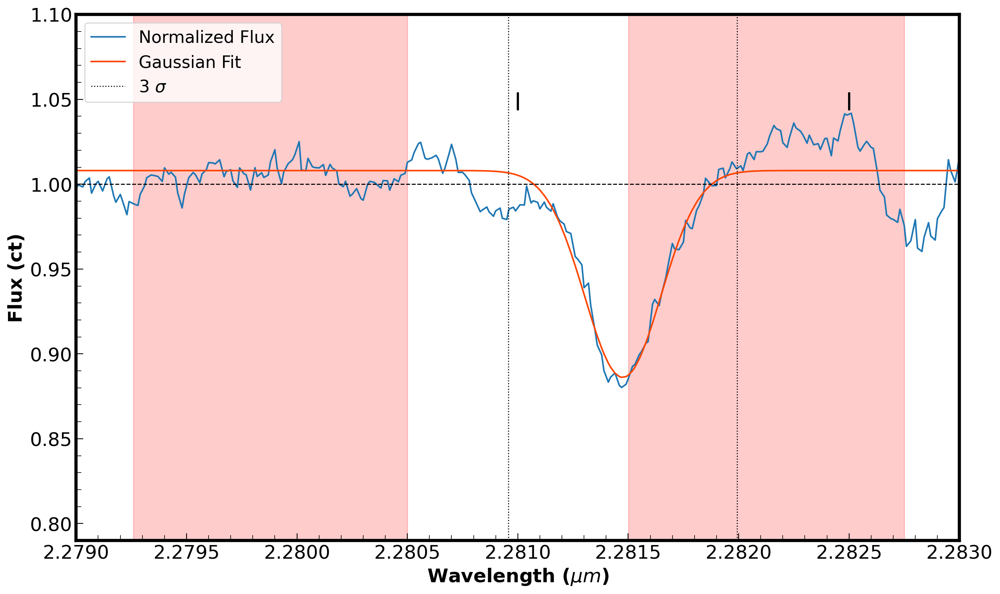

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0047944242752165
Relative Absorption: -0.00479442427521648
Half Max Flux: 1.0023972121376081
Half Relative Absorption: -0.00239721213760824


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

5.327857404536729e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000025?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000021


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[23]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

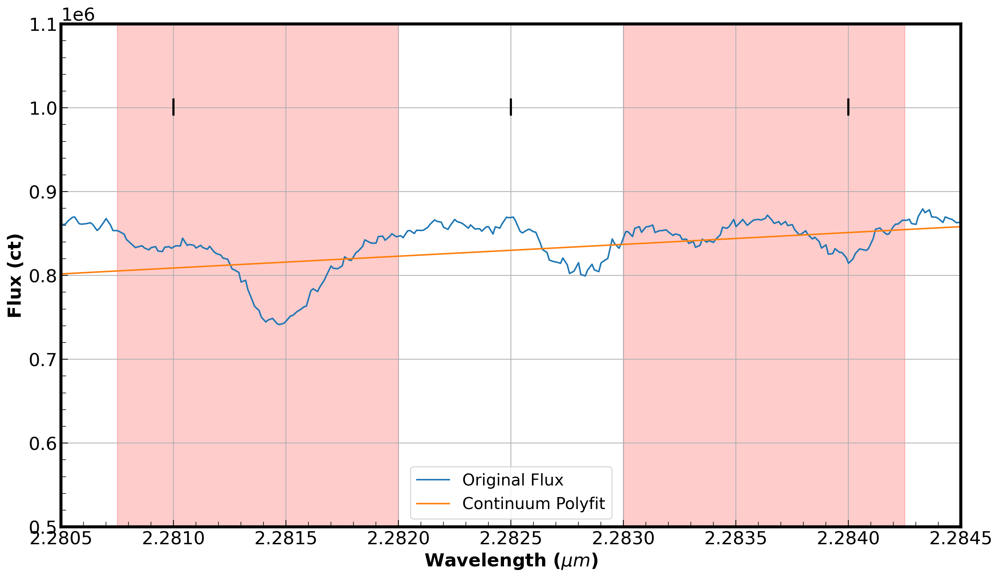

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.5e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=5000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-1.08674828e+00  2.29198121e+00  1.77567030e-03  1.00654145e+00]


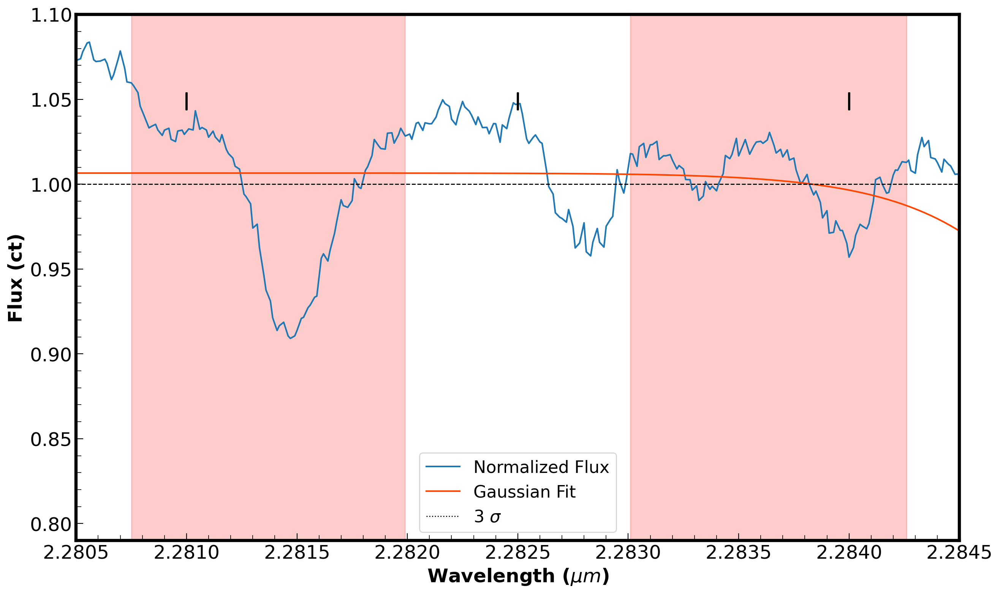

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0063793488278345
Relative Absorption: -0.00637934882783453
Half Max Flux: 1.0031896744139173
Half Relative Absorption: -0.003189674413917265


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.00020175684426166542

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000016?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000006


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[24]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

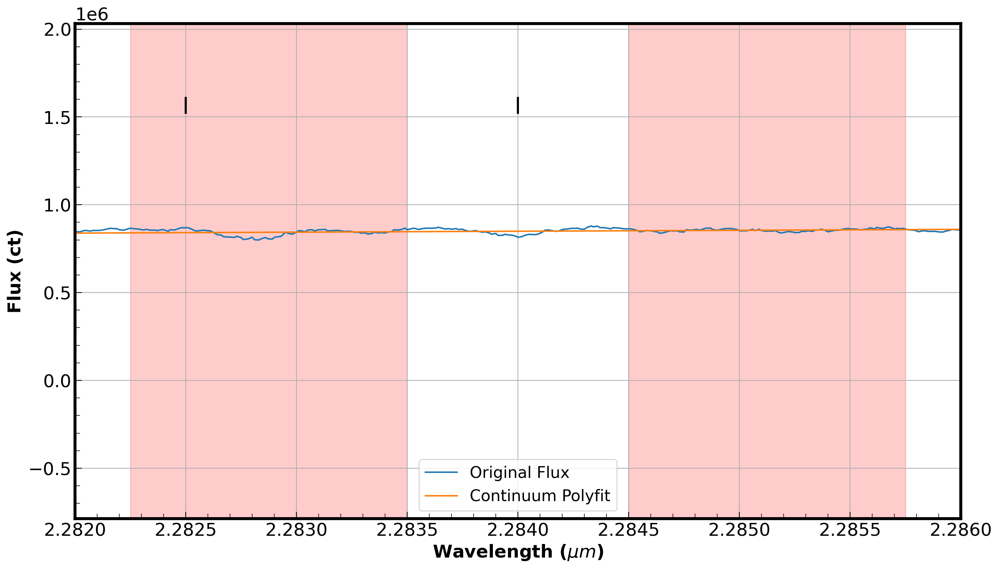

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[25]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=1000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")